# 1. Import Libraries

In [1]:
%matplotlib inline

In [2]:
import pandas as pd
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from itertools import cycle
import warnings
from dateutil.relativedelta import relativedelta
from sklearn.preprocessing import StandardScaler
# import lightgbm
# from lightgbm import LGBMRegressor
# from sklearn.model_selection import RandomizedSearchCV
# import joblib
# import os

# import seaborn as sns

# import pickle
# from pathlib import Path
# import numpy as np
# import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

# from dateutil.relativedelta import relativedelta
# import pandas as pd
# import numpy as np
# import matplotlib.pylab as plt
# import seaborn as sns

%matplotlib inline
plt.style.use('bmh')
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']
color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
# Better rendering 
from IPython.core.display import HTML
HTML("<style>.rendered_html th {max-width: 120px;}</style>")

warnings.filterwarnings('ignore')

# settings to display all columns
pd.set_option("display.max_columns", None)

In [4]:
%%html
<style>
.dataframe td {
    white-space: nowrap;
}
</style>

# 2. Fucntions

In [5]:
# Functions

# Heatmap Colouring
# ----------------------------------------------------------------------------
# Author:  Nicolas P. Rougier
# License: BSD
# ----------------------------------------------------------------------------

def calmap(ax, year, data):
    """
    Requirements
    ------------
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.patches import Polygon
    from datetime import datetime
    from dateutil.relativedelta import relativedelta
    
    
    Parameters
    ----------
    df : Pandas Dataframe
        
    Returns
    -------
    Plot
    """
    ax.tick_params('x', length=0, labelsize="medium", which='major')
    ax.tick_params('y', length=0, labelsize="x-small", which='major')

    # Month borders
    xticks, labels = [], []
    start = datetime(year,1,1).weekday()
    for month in range(1,13):
        first = datetime(year, month, 1)
        last = first + relativedelta(months=1, days=-1)

        y0 = first.weekday()
        y1 = last.weekday()
        x0 = (int(first.strftime("%j"))+start-1)//7
        x1 = (int(last.strftime("%j"))+start-1)//7

        P = [ (x0,   y0), (x0,    7),  (x1,   7),
              (x1,   y1+1), (x1+1,  y1+1), (x1+1, 0),
              (x0+1,  0), (x0+1,  y0) ]
        xticks.append(x0 +(x1-x0+1)/2)
        labels.append(first.strftime("%b"))
        poly = Polygon(P, edgecolor="black", facecolor="None",
                       linewidth=1, zorder=20, clip_on=False)
        ax.add_artist(poly)
    
    ax.set_xticks(xticks)
    ax.set_xticklabels(labels)
    ax.set_yticks(0.5 + np.arange(7))
    ax.set_yticklabels(["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"])
    ax.set_title("{}".format(year), weight="semibold")
    
    # Clearing first and last day from the data
    valid = datetime(year, 1, 1).weekday()
    data[:valid,0] = np.nan
    valid = datetime(year, 12, 31).weekday()
    # data[:,x1+1:] = np.nan
    data[valid+1:,x1] = np.nan

    # Showing data
    ax.imshow(data, extent=[0,53,0,7], zorder=10, vmin=-1, vmax=1,
              cmap="RdYlBu_r", origin="lower", alpha=.75)

---

# 3. Import Data 

In [6]:
%store -r sales
%store -r calendar
%store -r prices

In [7]:
 0 in sales.values

True

In [8]:
# place holder for sales column names
sales_cols_names = [i for i in sales.columns if 'd_' in i]

In [9]:
# Exploratory: Sales sum per day
sales_sum_per_day = pd.DataFrame(sales.groupby(['id'])[sales_cols_names].sum())
sales_sum_per_day.head(5)

d_1  d_2  d_3  d_4  d_5  d_6  d_7  d_8  d_9  \
id                                                                         
FOODS_1_001_CA_1_evaluation    3    0    0    1    4    2    0    2    0   
FOODS_1_001_CA_2_evaluation    2    0    0    0    1    0    8    0    4   
FOODS_1_001_CA_3_evaluation    1    2    1    1    1    2    0    1    1   
FOODS_1_001_CA_4_evaluation    0    1    1    1    1    1    0    0    0   
FOODS_1_001_TX_1_evaluation    0    1    1    0    0    0    0    0    2   

                             d_10  d_11  d_12  d_13  d_14  d_15  d_16  d_17  \
id                                                                            
FOODS_1_001_CA_1_evaluation     0     0     0     3     1     3     0     2   
FOODS_1_001_CA_2_evaluation     1     2     1     1     3     4     1     2   
FOODS_1_001_CA_3_evaluation     1     0     0     3     3     2     7     1   
FOODS_1_001_CA_4_evaluation     0     0     0     1     2     1     0     1   
FOODS_1_001_TX_1_evaluation     1     0     0     0     1     0     0     0   

                             d_18  d_19  d_20  d_21  d_22  d_23  d_24  d_25  \
id                                                                            
FOODS_1_001_CA_1_evaluation     1     2     0     2     1     2     0     2   
FOODS_1_001_CA_2_evaluation     2     2     0     1     1     1     1     2   
FOODS_1_001_CA_3_evaluation     2     4     0     1     1     3     2     0   
FOODS_1_001_CA_4_evaluation     0     0     1     0     2     0     1     0   
FOODS_1_001_TX_1_evaluation     0     0     0     0     0     1     2     0   

                             d_26  d_27  d_28  d_29  d_30  d_31  d_32  d_33  \
id                                                                            
FOODS_1_001_CA_1_evaluation     2     2     4     2     2     0     2     1   
FOODS_1_001_CA_2_evaluation     3    16     0     0     0     0     0     1   
FOODS_1_001_CA_3_evaluation     0     0     0     6     6     1     1     0   
FOODS_1_001_CA_4_evaluation     1     1     0     1     0     0     1     1   
FOODS_1_001_TX_1_evaluation     0     2     0     0     0     0     3     1   

                             d_34  d_35  d_36  d_37  d_38  d_39  d_40  d_41  \
id                                                                            
FOODS_1_001_CA_1_evaluation     7     1     2     3     0     1     2     3   
FOODS_1_001_CA_2_evaluation     1     1     1     3     1     0     0     0   
FOODS_1_001_CA_3_evaluation     0     4     3     6     5     1     0     3   
FOODS_1_001_CA_4_evaluation     1     0     0     1     2     2     2     1   
FOODS_1_001_TX_1_evaluation     0     0     0     0     0     0     0     0   

                             d_42  d_43  d_44  d_45  d_46  d_47  d_48  d_49  \
id                                                                            
FOODS_1_001_CA_1_evaluation     0     1     5     0     0     1     0     0   
FOODS_1_001_CA_2_evaluation     1     2     1     1     0     0     3     3   
FOODS_1_001_CA_3_evaluation     1     1     1     0     1     3     0     0   
FOODS_1_001_CA_4_evaluation     0     0     1     0     0     0     4     0   
FOODS_1_001_TX_1_evaluation     0     1     0     1     1     1     0     0   

                             d_50  d_51  d_52  d_53  d_54  d_55  d_56  d_57  \
id                                                                            
FOODS_1_001_CA_1_evaluation     1     1     1     1     1     0     1     2   
FOODS_1_001_CA_2_evaluation     4     0     0     3     1     2     0     1   
FOODS_1_001_CA_3_evaluation     1     1     4     1     0     0     1     1   
FOODS_1_001_CA_4_evaluation     0     1     2     2     0     0     0     0   
FOODS_1_001_TX_1_evaluation     6     0     4     0     1     1     0     1   

                             d_58  d_59  d_60  d_61  d_62  d_63  d_64  d_65  \
id                                                                            
FOODS_1_001_CA

In [10]:
 0 in sales_sum_per_day.values
# There are days where certain items do not sell

True

# 4. Exploratory Analysis

Going to explore the dataset.
During Data ingestion we discovered that the sales dataframe has 3049 unique items. 
An exploration of each one will take a considerable amount of time. 
In return we shall look for the highest selling item look at its features.
Through its features extrapolate what can be learned and then apply it to the others.

In [11]:
# Which item has the highest sales
sales_sum_per_day['total'] = sales_sum_per_day[sales_cols_names].sum(axis=1) #add a sum column totaling all the days
sales_sum_per_day.nlargest(3, 'total').head() #Show the three largest sum totals


# highest sales sum total is item FOODS_3_090

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,d_35,d_36,d_37,d_38,d_39,d_40,d_41,d_42,d_43,d_44,d_45,d_46,d_47,d_48,d_49,d_50,d_51,d_52,d_53,d_54,d_55,d_56,d_57,d_58,d_59,d_60,d_61,d_62,d_63,d_64,d_65,d_66,d_67,d_68,d_69,d_70,d_71,d_72,d_73,d_74,d_75,d_76,d_77,d_78,d_79,d_80,d_81,d_82,d_83,d_84,d_85,d_86,d_87,d_88,d_89,d_90,d_91,d_92,d_93,d_94,d_95,d_96,d_97,d_98,d_99,d_100,d_101,d_102,d_103,d_104,d_105,d_106,d_107,d_108,d_109,d_110,d_111,d_112,d_113,d_114,d_115,d_116,d_117,d_118,d_119,d_120,d_121,d_122,d_123,d_124,d_125,d_126,d_127,d_128,d_129,d_130,d_131,d_132,d_133,d_134,d_135,d_136,d_137,d_138,d_139,d_140,d_141,d_142,d_143,d_144,d_145,d_146,d_147,d_148,d_149,d_150,d_151,d_152,d_153,d_154,d_155,d_156,d_157,d_158,d_159,d_160,d_161,d_162,d_163,d_164,d_165,d_166,d_167,d_168,d_169,d_170,d_171,d_172,d_173,d_174,d_175,d_176,d_177,d_178,d_179,d_180,d_181,d_182,d_183,d_184,d_185,d_186,d_187,d_188,d_189,d_190,d_191,d_192,d_193,d_194,d_195,d_196,d_197,d_198,d_199,d_200,d_201,d_202,d_203,d_204,d_205,d_206,d_207,d_208,d_209,d_210,d_211,d_212,d_213,d_214,d_215,d_216,d_217,d_218,d_219,d_220,d_221,d_222,d_223,d_224,d_225,d_226,d_227,d_228,d_229,d_230,d_231,d_232,d_233,d_234,d_235,d_236,d_237,d_238,d_239,d_240,d_241,d_242,d_243,d_244,d_245,d_246,d_247,d_248,d_249,d_250,d_251,d_252,d_253,d_254,d_255,d_256,d_257,d_258,d_259,d_260,d_261,d_262,d_263,d_264,d_265,d_266,d_267,d_268,d_269,d_270,d_271,d_272,d_273,d_274,d_275,d_276,d_277,d_278,d_279,d_280,d_281,d_282,d_283,d_284,d_285,d_286,d_287,d_288,d_289,d_290,d_291,d_292,d_293,d_294,d_295,d_296,d_297,d_298,d_299,d_300,d_301,d_302,d_303,d_304,d_305,d_306,d_307,d_308,d_309,d_310,d_311,d_312,d_313,d_314,d_315,d_316,d_317,d_318,d_319,d_320,d_321,d_322,d_323,d_324,d_325,d_326,d_327,d_328,d_329,d_330,d_331,d_332,d_333,d_334,d_335,d_336,d_337,d_338,d_339,d_340,d_341,d_342,d_343,d_344,d_345,d_346,d_347,d_348,d_349,d_350,d_351,d_352,d_353,d_354,d_355,d_356,d_357,d_358,d_359,d_360,d_361,d_362,d_363,d_364,d_365,d_366,d_367,d_368,d_369,d_370,d_371,d_372,d_373,d_374,d_375,d_376,d_377,d_378,d_379,d_380,d_381,d_382,d_383,d_384,d_385,d_386,d_387,d_388,d_389,d_390,d_391,d_392,d_393,d_394,d_395,d_396,d_397,d_398,d_399,d_400,d_401,d_402,d_403,d_404,d_405,d_406,d_407,d_408,d_409,d_410,d_411,d_412,d_413,d_414,d_415,d_416,d_417,d_418,d_419,d_420,d_421,d_422,d_423,d_424,d_425,d_426,d_427,d_428,d_429,d_430,d_431,d_432,d_433,d_434,d_435,d_436,d_437,d_438,d_439,d_440,d_441,d_442,d_443,d_444,d_445,d_446,d_447,d_448,d_449,d_450,d_451,d_452,d_453,d_454,d_455,d_456,d_457,d_458,d_459,d_460,d_461,d_462,d_463,d_464,d_465,d_466,d_467,d_468,d_469,d_470,d_471,d_472,d_473,d_474,d_475,d_476,d_477,d_478,d_479,d_480,d_481,d_482,d_483,d_484,d_485,d_486,d_487,d_488,d_489,d_490,d_491,d_492,d_493,d_494,d_495,d_496,d_497,d_498,d_499,d_500,d_501,d_502,d_503,d_504,d_505,d_506,d_507,d_508,d_509,d_510,d_511,d_512,d_513,d_514,d_515,d_516,d_517,d_518,d_519,d_520,d_521,d_522,d_523,d_524,d_525,d_526,d_527,d_528,d_529,d_530,d_531,d_532,d_533,d_534,d_535,d_536,d_537,d_538,d_539,d_540,d_541,d_542,d_543,d_544,d_545,d_546,d_547,d_548,d_549,d_550,d_551,d_552,d_553,d_554,d_555,d_556,d_557,d_558,d_559,d_560,d_561,d_562,d_563,d_564,d_565,d_566,d_567,d_568,d_569,d_570,d_571,d_572,d_573,d_574,d_575,d_576,d_577,d_578,d_579,d_580,d_581,d_582,d_583,d_584,d_585,d_586,d_587,d_588,d_589,d_590,d_591,d_592,d_593,d_594,d_595,d_596,d_597,d_598,d_599,d_600,d_601,d_602,d_603,d_604,d_605,d_606,d_607,d_608,d_609,d_610,d_611,d_612,d_613,d_614,d_615,d_616,d_617,d_618,d_619,d_620,d_621,d_622,d_623,d_624,d_625,d_626,d_627,d_628,d_629,d_630,d_631,d_632,d_633,d_634,d_635,d_636,d_637,d_638,d_639,d_640,d_641,d_642,d_643,d_644,d_645,d_646,d_647,d_648,d_649,d_650,d_651,d_652,d_653,d_654,d_655,d_656,d_657,d_658,d_659,d_660,d_661,d_662,d_663,d_664,d_665,d_666,d_667,d_668,d_669,d_670,d_671,d_672,d_673,d_674,d_675,d_676,d_677,d_678,d_679,d_680,d_681,d_682,d_683,d_684,d_6

<Axes: xlabel='id'>

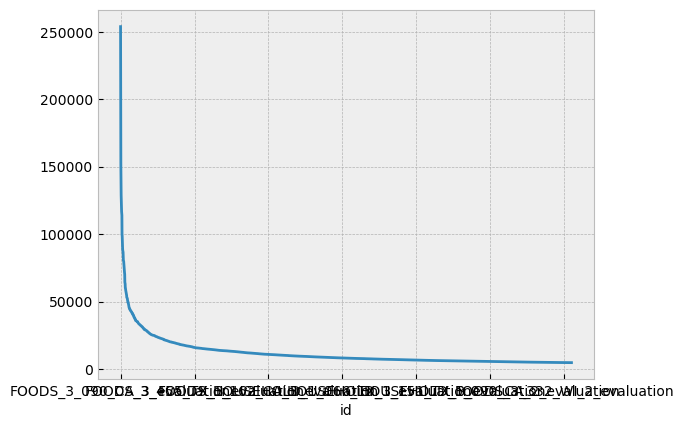

In [12]:
# Curious to see if it follows a pareto's principle
# 1. Select Columnn
# 2. Return the largest 3049 elements
# 3. Plot them on a line chart
sales_sum_per_day['total']\
    .nlargest(n=3049)\
    .plot()     


Results: Sales follow a pareto principle with a very long tail.
Idea: Could retail sales follow long tail economics? 
If it does what are the implications for store vs online demand forecasting dynamics

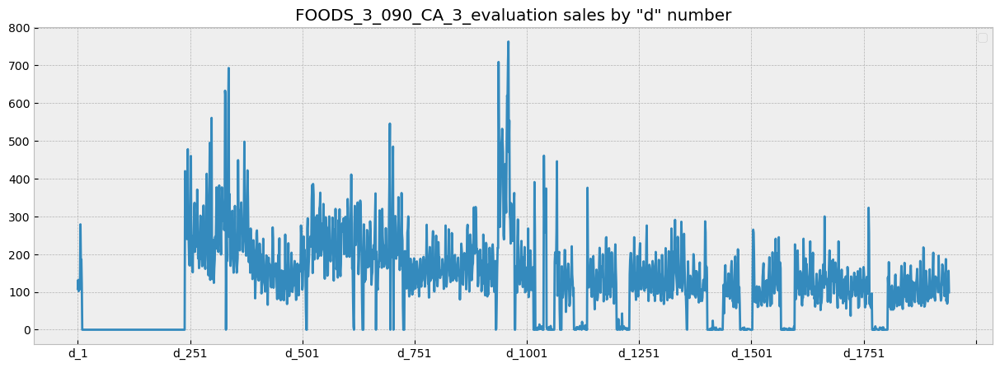

In [13]:
# Show highest selling food item by day number

# 1. Select the item.
# 2. Set the id as the index, Keep only sales data columns
# 3. Transform so it's a column
# 4. Plot the data
sales.loc[sales['id'] == 'FOODS_3_090_CA_3_evaluation'] \
    .set_index('id')[sales_cols_names] \
    .T \
    .plot(figsize=(15, 5),
          title='FOODS_3_090_CA_3_evaluation sales by "d" number',
          color=next(color_cycle))
plt.legend('')
plt.show()

[8412]


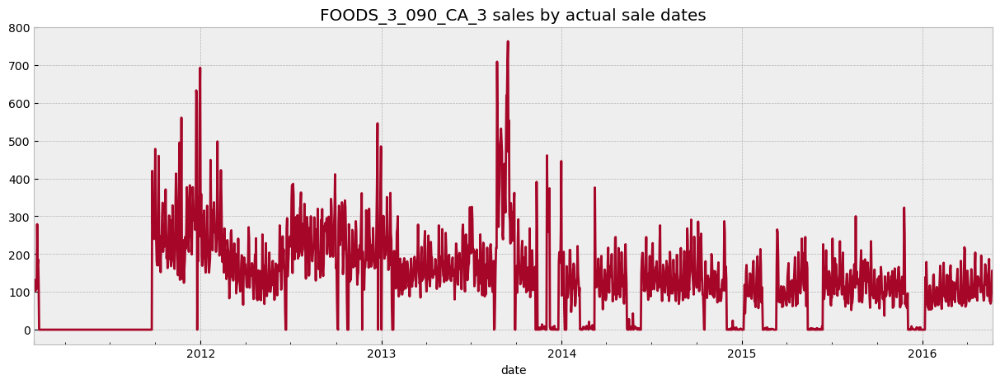

In [14]:
# Show highest selling item by date 

# 1. Access a group of rows and columns by label
# 2. Transpose dataframe to equal calendar
# 3. Rename column 8412 to FOOD_3_090_CA_3 for easier identification later
# 4. Reset index
# 5. Merge calendar on our items' data to access dates
# 6. Plot result 
foods_3_CA_3 = sales.loc[sales['id'] == 'FOODS_3_090_CA_3_evaluation'][sales_cols_names].T
print(foods_3_CA_3.columns.values)
foods_3_CA_3 = foods_3_CA_3.rename(columns={8412:'FOODS_3_090_CA_3'}) 
foods_3_CA_3 = foods_3_CA_3.reset_index().rename(columns={'index': 'd'})
foods_3_CA_3 = foods_3_CA_3.merge(calendar, how='left', validate='1:1')
foods_3_CA_3.set_index('date')['FOODS_3_090_CA_3'] \
    .plot(figsize=(15, 5),
          color=next(color_cycle),
          title='FOODS_3_090_CA_3 sales by actual sale dates')
plt.show()

## Top Selling Items

In the previous data ingestion module. We learnt that there are three unique categories in the dataset.
 - FOODS
 - HOBBIES
 - HOUSEHOLD

We know that FOODS_3_090_CA_3_evaluation is the top selling across the entire dataset and in FOODS. My aim for the next section is to use the same code above in a loop it find the top selling items in each category. To see if there are any trends for exploration.

In [15]:
# Search for top selling items in other categories.


for i in ['FOODS','HOBBIES', 'HOUSEHOLD']:
    place_holder = sales[sales['cat_id'] == i]
    place_holder = pd.DataFrame(place_holder.groupby(['id'])[sales_cols_names].sum())
    place_holder['total'] = place_holder[sales_cols_names].sum(axis=1)
    print(place_holder.nlargest(3, 'total').index[0])


FOODS_3_090_CA_3_evaluation
HOBBIES_1_234_CA_3_evaluation
HOUSEHOLD_1_118_CA_3_evaluation


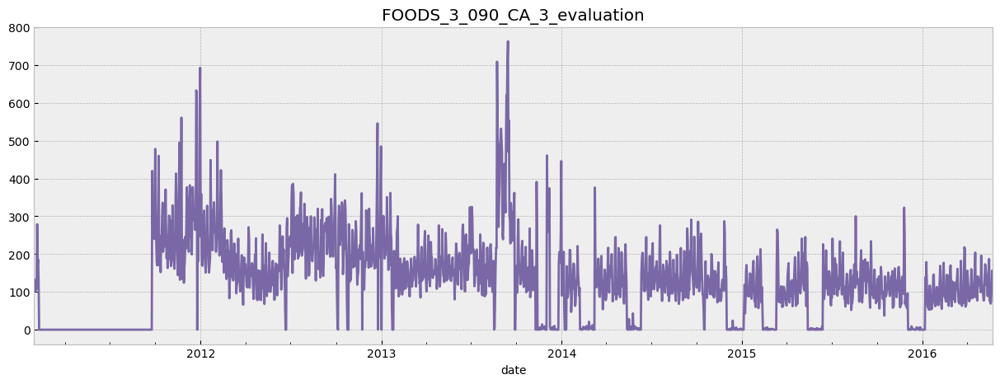

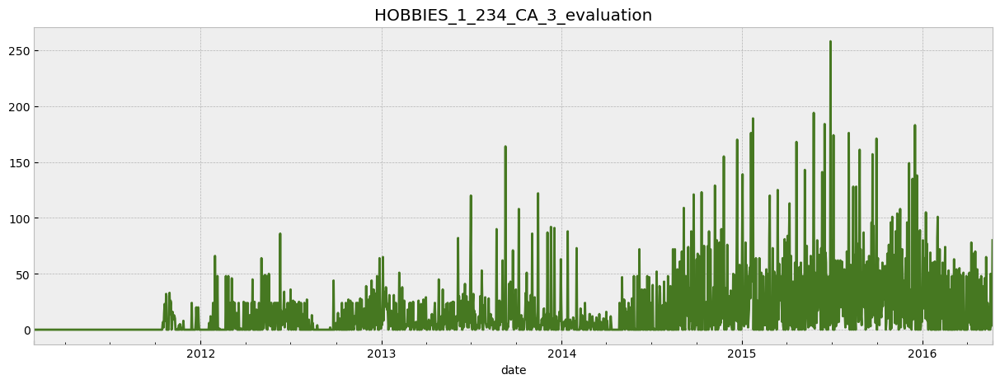

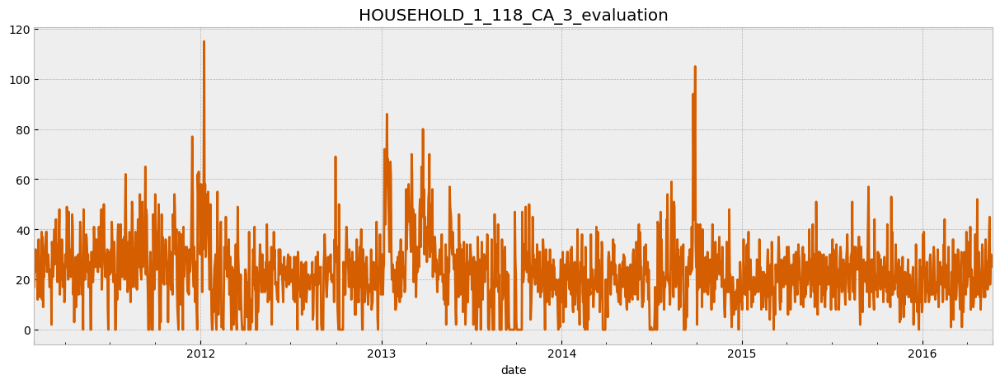

In [16]:
# Plot top selling examples

for i in ['FOODS_3_090_CA_3_evaluation','HOBBIES_1_234_CA_3_evaluation', 'HOUSEHOLD_1_118_CA_3_evaluation']:
    place_holder = sales.loc[sales['id'] == i][sales_cols_names].T
    place_holder = place_holder.rename(columns={place_holder.columns.values[0]:i})
    place_holder = place_holder.reset_index().rename(columns={'index': 'd'})
    place_holder = place_holder.merge(calendar, how='left', validate='1:1')
    place_holder.set_index('date')[i] \
    .plot(figsize=(15, 5),
          color=next(color_cycle),
          title=i)
    plt.show()

### Results:

The charts are hrd to read but there are some patterns.
 - Food item only sells in runs. Mayb due to stockout
 - Hobbies items had a slow start but sales are pickign up considerably
 - Household item sells at a near consistent rate.

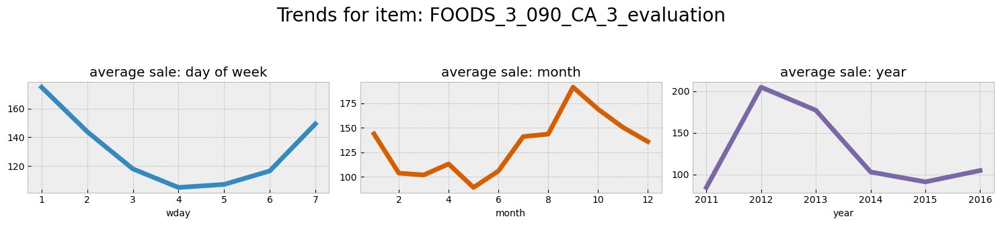

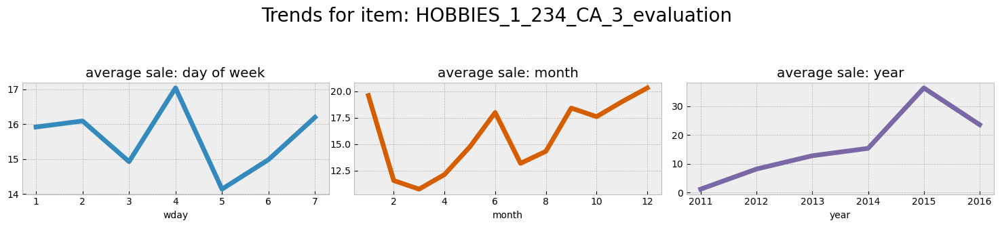

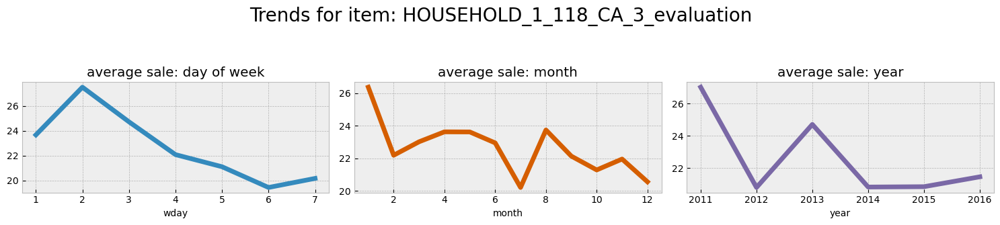

In [17]:
for i in ['FOODS_3_090_CA_3_evaluation','HOBBIES_1_234_CA_3_evaluation', 'HOUSEHOLD_1_118_CA_3_evaluation']:
    place_holder = sales.loc[sales['id'] == i][sales_cols_names].T
    place_holder = place_holder.rename(columns={place_holder.columns.values[0]:i})
    place_holder = place_holder.reset_index().rename(columns={'index': 'd'})
    place_holder = place_holder.merge(calendar, how='left', validate='1:1')
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    place_holder.groupby('wday').mean(numeric_only=True)[i] \
        .plot(kind='line',
              title='average sale: day of week',
              lw=5,
              color=color_pal[0],
              ax=ax1)
    place_holder.groupby('month').mean(numeric_only=True)[i] \
        .plot(kind='line',
              title='average sale: month',
              lw=5,
              color=color_pal[4],
              ax=ax2)
    place_holder.groupby('year').mean(numeric_only=True)[i] \
        .plot(kind='line',
              lw=5,
              title='average sale: year',
              color=color_pal[2],

              ax=ax3)
    fig.suptitle(f'Trends for item: {i}',
                 size=20,
                 y=1.1)
    plt.tight_layout()
    plt.show()

## Results.

The data does exhibit trends and seasonality at the week, month and year level. In this case, this data is safe to use for time series analysis using models such as the ARIMA model.

In [18]:
random_products = sales.sample(20, random_state=529).set_index('id').index.tolist()

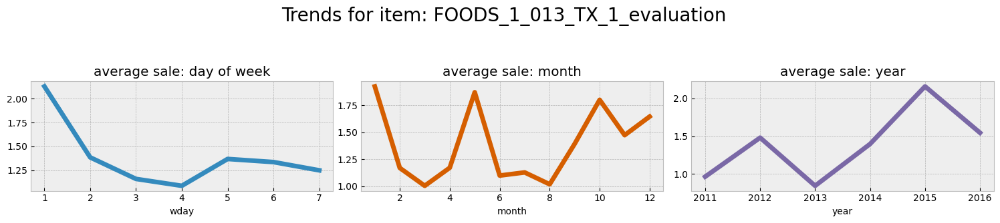

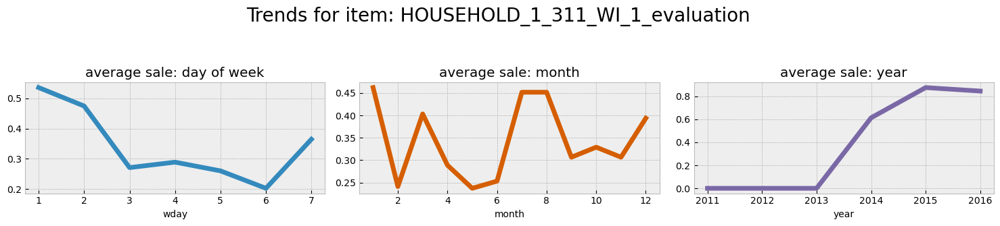

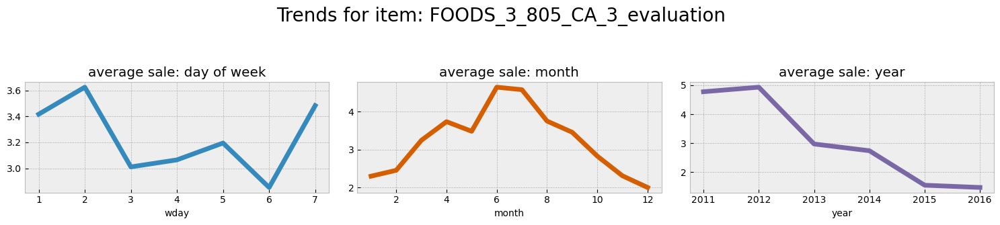

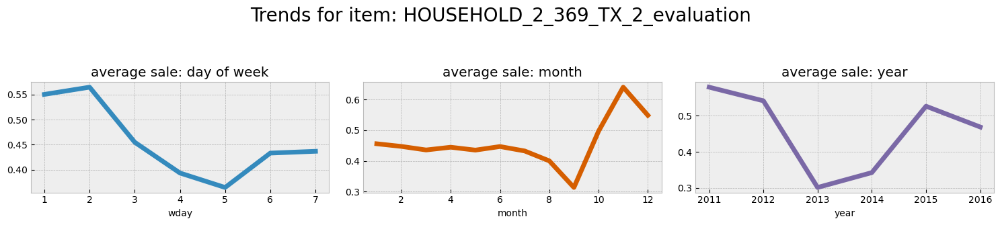

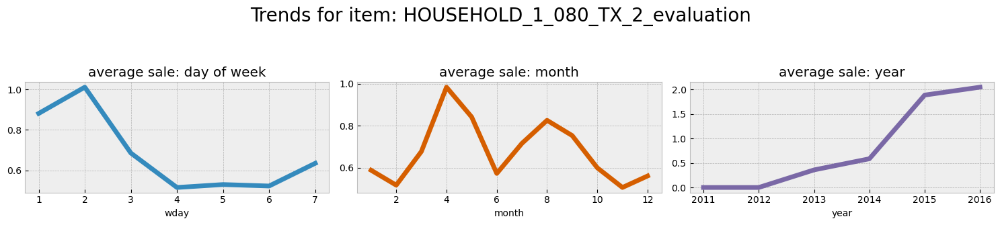

...

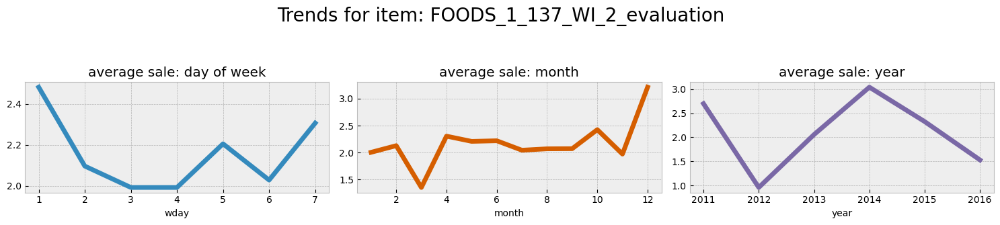

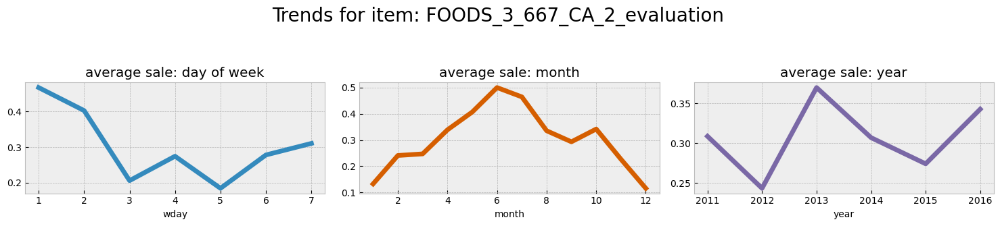

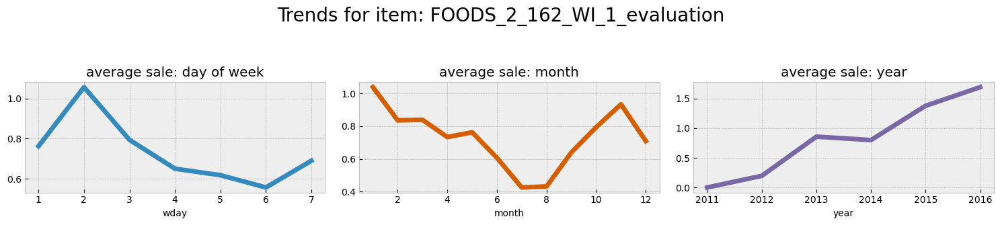

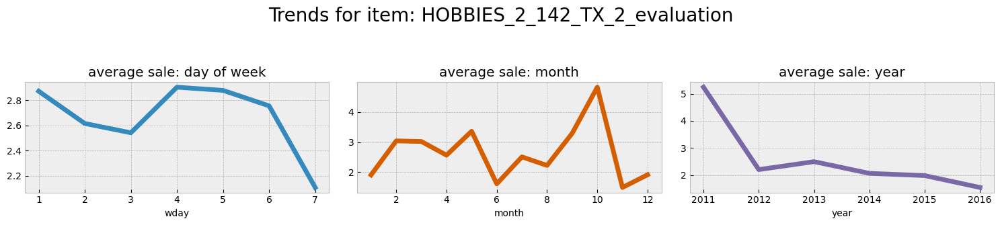

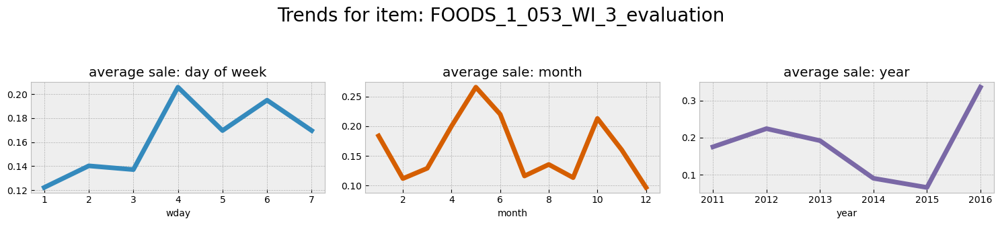

In [19]:
for i in random_products:
    place_holder = sales.loc[sales['id'] == i][sales_cols_names].T
    place_holder = place_holder.rename(columns={place_holder.columns.values[0]:i})
    place_holder = place_holder.reset_index().rename(columns={'index': 'd'})
    place_holder = place_holder.merge(calendar, how='left', validate='1:1')
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    place_holder.groupby('wday').mean(numeric_only=True)[i] \
        .plot(kind='line',
              title='average sale: day of week',
              lw=5,
              color=color_pal[0],
              ax=ax1)
    place_holder.groupby('month').mean(numeric_only=True)[i] \
        .plot(kind='line',
              title='average sale: month',
              lw=5,
              color=color_pal[4],
              ax=ax2)
    place_holder.groupby('year').mean(numeric_only=True)[i] \
        .plot(kind='line',
              lw=5,
              title='average sale: year',
              color=color_pal[2],

              ax=ax3)
    fig.suptitle(f'Trends for item: {i}',
                 size=20,
                 y=1.1)
    plt.tight_layout()
    plt.show()

### Results

On the review of a random state of 20 products they show trend and seasonality. I am confident a time series forcasting model will be suitable for this dataset.

## Exploratory ananlysis - By Product Category Type

### How many unique categories are there?

We ahve established from data ingestion that there are three unique product categories
 - Foods
 - Household
 - Hobbies    

<Axes: title={'center': 'Count of Items by Category'}, xlabel='No. of Items', ylabel='Categories'>

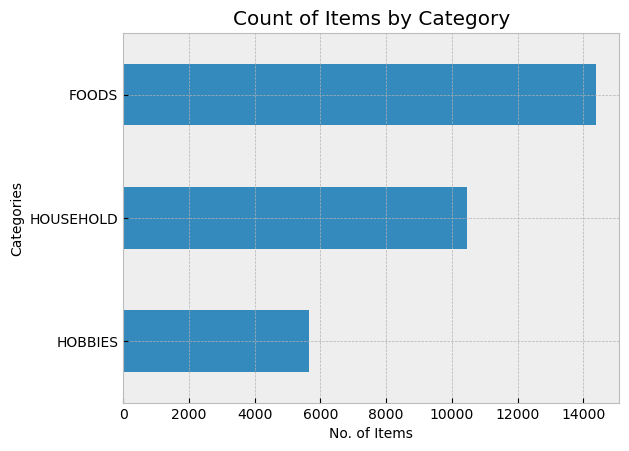

In [20]:
# How many by sales value?

# 1. Group sales dataframe by 'cat_id', count it and select only the column 'item_id'.
# 2. Sort values by asceding order.
# 3. Plot data on a horizontal bar plot to visualise which one is far ahead.
# 4. Annotate bars with values.

sales.groupby('cat_id').count()['item_id'] \
     .sort_values() \
     .plot.barh(title='Count of Items by Category',
               ylabel='Categories',
               xlabel='No. of Items')


#### Results

It is clear that Foods has the highest number of items (SKU), followed by Household and then Hobbies.




## Number of sales per category

In [21]:
# Check sales total.

Total = sales_sum_per_day['total'].sum()
print(Total)


66927173


<Axes: title={'center': 'Count of Items by Category'}, xlabel='No. of Items', ylabel='Categories'>

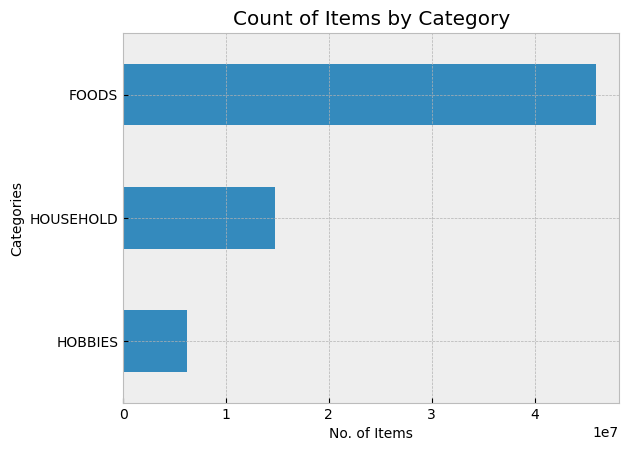

In [22]:
# Plot sales per category.
# 1. Sum sales by day columns grouped by category.
# 2. Create a new column with totals of each category row.
# 3. Plot using horizontal bar as above.

sales_sum_per_day_cat = pd.DataFrame(sales.groupby(['cat_id'])[sales_cols_names].sum())
sales_sum_per_day_cat['total'] = sales_sum_per_day_cat[sales_cols_names].sum(axis=1)

sales_sum_per_day_cat['total'].sort_values().plot.barh(title='Count of Items by Category',
               ylabel='Categories',
               xlabel='No. of Items')

In [23]:
calendar.set_index('d')['date'].head()

d
d_1   2011-01-29
d_2   2011-01-30
d_3   2011-01-31
d_4   2011-02-01
d_5   2011-02-02
Name: date, dtype: datetime64[ns]

In [24]:
sales.set_index('id')[sales_cols_names].T.head()

id,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_006_CA_1_evaluation,HOBBIES_1_007_CA_1_evaluation,HOBBIES_1_008_CA_1_evaluation,HOBBIES_1_009_CA_1_evaluation,HOBBIES_1_010_CA_1_evaluation,HOBBIES_1_011_CA_1_evaluation,HOBBIES_1_012_CA_1_evaluation,HOBBIES_1_013_CA_1_evaluation,HOBBIES_1_014_CA_1_evaluation,HOBBIES_1_015_CA_1_evaluation,HOBBIES_1_016_CA_1_evaluation,HOBBIES_1_017_CA_1_evaluation,HOBBIES_1_018_CA_1_evaluation,HOBBIES_1_019_CA_1_evaluation,HOBBIES_1_020_CA_1_evaluation,HOBBIES_1_021_CA_1_evaluation,HOBBIES_1_022_CA_1_evaluation,HOBBIES_1_023_CA_1_evaluation,HOBBIES_1_024_CA_1_evaluation,HOBBIES_1_025_CA_1_evaluation,HOBBIES_1_026_CA_1_evaluation,HOBBIES_1_027_CA_1_evaluation,HOBBIES_1_028_CA_1_evaluation,HOBBIES_1_029_CA_1_evaluation,HOBBIES_1_030_CA_1_evaluation,HOBBIES_1_031_CA_1_evaluation,HOBBIES_1_032_CA_1_evaluation,HOBBIES_1_033_CA_1_evaluation,HOBBIES_1_034_CA_1_evaluation,HOBBIES_1_035_CA_1_evaluation,HOBBIES_1_036_CA_1_evaluation,HOBBIES_1_037_CA_1_evaluation,HOBBIES_1_038_CA_1_evaluation,HOBBIES_1_039_CA_1_evaluation,HOBBIES_1_040_CA_1_evaluation,HOBBIES_1_041_CA_1_evaluation,HOBBIES_1_042_CA_1_evaluation,HOBBIES_1_043_CA_1_evaluation,HOBBIES_1_044_CA_1_evaluation,HOBBIES_1_045_CA_1_evaluation,HOBBIES_1_046_CA_1_evaluation,HOBBIES_1_047_CA_1_evaluation,HOBBIES_1_048_CA_1_evaluation,HOBBIES_1_049_CA_1_evaluation,HOBBIES_1_050_CA_1_evaluation,HOBBIES_1_051_CA_1_evaluation,HOBBIES_1_052_CA_1_evaluation,HOBBIES_1_053_CA_1_evaluation,HOBBIES_1_054_CA_1_evaluation,HOBBIES_1_055_CA_1_evaluation,HOBBIES_1_056_CA_1_evaluation,HOBBIES_1_057_CA_1_evaluation,HOBBIES_1_058_CA_1_evaluation,HOBBIES_1_060_CA_1_evaluation,HOBBIES_1_061_CA_1_evaluation,HOBBIES_1_062_CA_1_evaluation,HOBBIES_1_063_CA_1_evaluation,HOBBIES_1_064_CA_1_evaluation,HOBBIES_1_065_CA_1_evaluation,HOBBIES_1_066_CA_1_evaluation,HOBBIES_1_067_CA_1_evaluation,HOBBIES_1_068_CA_1_evaluation,HOBBIES_1_069_CA_1_evaluation,HOBBIES_1_070_CA_1_evaluation,HOBBIES_1_072_CA_1_evaluation,HOBBIES_1_073_CA_1_evaluation,HOBBIES_1_074_CA_1_evaluation,HOBBIES_1_075_CA_1_evaluation,HOBBIES_1_076_CA_1_evaluation,HOBBIES_1_077_CA_1_evaluation,HOBBIES_1_078_CA_1_evaluation,HOBBIES_1_079_CA_1_evaluation,HOBBIES_1_080_CA_1_evaluation,HOBBIES_1_081_CA_1_evaluation,HOBBIES_1_082_CA_1_evaluation,HOBBIES_1_083_CA_1_evaluation,HOBBIES_1_084_CA_1_evaluation,HOBBIES_1_085_CA_1_evaluation,HOBBIES_1_086_CA_1_evaluation,HOBBIES_1_087_CA_1_evaluation,HOBBIES_1_088_CA_1_evaluation,HOBBIES_1_089_CA_1_evaluation,HOBBIES_1_090_CA_1_evaluation,HOBBIES_1_091_CA_1_evaluation,HOBBIES_1_092_CA_1_evaluation,HOBBIES_1_093_CA_1_evaluation,HOBBIES_1_094_CA_1_evaluation,HOBBIES_1_095_CA_1_evaluation,HOBBIES_1_097_CA_1_evaluation,HOBBIES_1_098_CA_1_evaluation,HOBBIES_1_099_CA_1_evaluation,HOBBIES_1_100_CA_1_evaluation,HOBBIES_1_102_CA_1_evaluation,HOBBIES_1_103_CA_1_evaluation,HOBBIES_1_104_CA_1_evaluation,HOBBIES_1_105_CA_1_evaluation,HOBBIES_1_106_CA_1_evaluation,HOBBIES_1_107_CA_1_evaluation,HOBBIES_1_108_CA_1_evaluation,HOBBIES_1_109_CA_1_evaluation,HOBBIES_1_110_CA_1_evaluation,HOBBIES_1_111_CA_1_evaluation,HOBBIES_1_112_CA_1_evaluation,HOBBIES_1_113_CA_1_evaluation,HOBBIES_1_114_CA_1_evaluation,HOBBIES_1_115_CA_1_evaluation,HOBBIES_1_116_CA_1_evaluation,HOBBIES_1_117_CA_1_evaluation,HOBBIES_1_118_CA_1_evaluation,HOBBIES_1_119_CA_1_evaluation,HOBBIES_1_120_CA_1_evaluation,HOBBIES_1_121_CA_1_evaluation,HOBBIES_1_122_CA_1_evaluation,HOBBIES_1_123_CA_1_evaluation,HOBBIES_1_124_CA_1_evaluation,HOBBIES_1_125_CA_1_evaluation,HOBBIES_1_126_CA_1_evaluation,HOBBIES_1_127_CA_1_evaluation,HOBBIES_1_128_CA_1_evaluation,HOBBIES_1_129_CA_1_evaluation,HOBBIES_1_130_CA_1_evaluation,HOBBIES_1_131_CA_1_evaluation,HOBBIES_1_132_CA_1_evaluation,HOBBIES_1_133_CA_1_evaluation,HOBBIES_1_134_CA_1_evaluation,HOBBIES_1_135_CA_1_evaluation,HOBBIES_1_136_CA_1_evaluation,HOBBIES_1_137_CA_1_evaluation,HOBBIES

#### Results

Foods has the highest sales per category.

### What is the time series view of unit sales in the different categories?

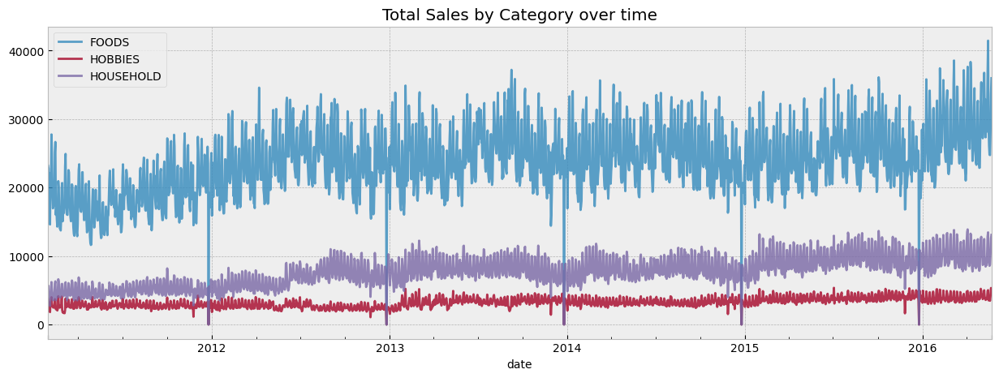

In [45]:
# What is a time series view?
# 1. create a container with sales dataframe indexed by 'id' and  sliced by sales cols 'd'.
# 2. Transpose it so 'd' are the row names.
# 3. Merge it with calendar dataframe index at 'd' column and sliced by 'date'.
# 4. Set the index of the new dataframe on 'date'.
# 5. iterate through the container looking throuhg the categories only if it matches container columns.

container = sales.set_index('id')[sales_cols_names] \
    .T \
    .merge(calendar.set_index('d')['date'],
           left_index=True,
           right_index=True,
            validate='1:1') \
    .set_index('date')

for i in ['FOODS','HOBBIES', 'HOUSEHOLD']:
    items_col = [c for c in container.columns if i in c]
    container[items_col] \
        .sum(axis=1) \
        .plot(figsize=(15, 5),
              alpha=0.8,
              title='Total Sales by Category over time')
plt.legend(['FOODS','HOBBIES', 'HOUSEHOLD'])
plt.show()

### What does the exploration tell us?

What I have found is that Foods category has the highest number of units by count and the highest number of sales by sum across time. To save on resources (computing and man hours) it would be prudent to focus on this specific category first. Achieve high accuracy and/or uncertainty rates then extrapolate on to other categories. Instead of trying to predict all categories at the same time. 

## What are sales per store

<Axes: title={'center': 'Count of Items sold by Store'}, xlabel='No. of Items', ylabel='Stores'>

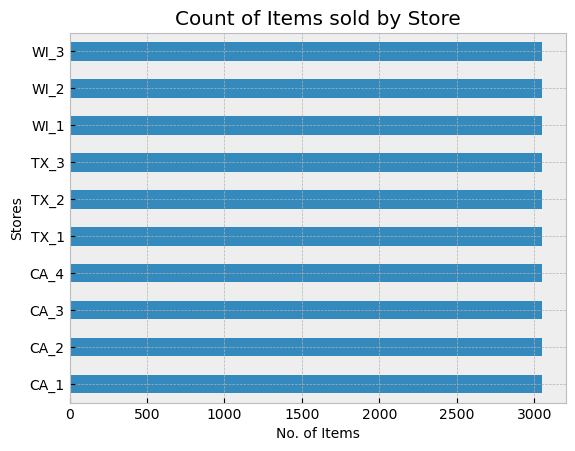

In [26]:
# How many by item count per store?

# 1. Group sales dataframe by 'store_id', count it and select only the column 'item_id'.
# 2. Sort values by asceding order.
# 3. Plot data on a horizontal bar plot to visualise which one is far ahead.
# 4. Annotate bars with values.

sales.groupby('store_id').count()['item_id'] \
        .sort_values() \
        .plot.barh(title='Count of Items sold by Store',
                   ylabel='Stores',
                   xlabel='No. of Items')

#### Results

All stores have the same offering. No uniqueness

<Axes: title={'center': 'Sale of Items by Store'}, xlabel='No. of Items sold', ylabel='Stores'>

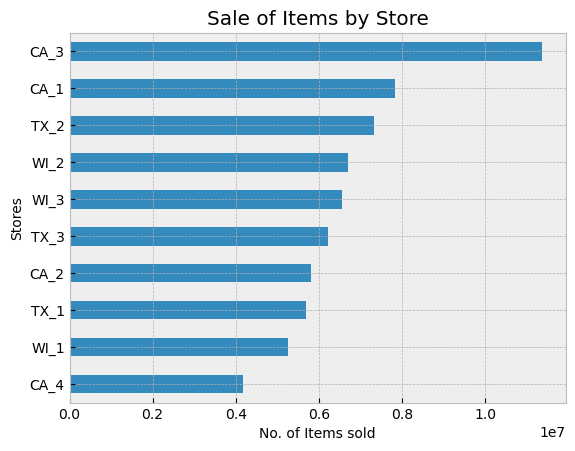

In [27]:
# Plot sales per store.
# 1. Sum sales by day columns grouped by category.
# 2. Create a new column with totals of each category row.
# 3. Plot using horizontal bar as above.

sales_sum_per_day_store = pd.DataFrame(sales.groupby(['store_id'])[sales_cols_names].sum())
sales_sum_per_day_store['total'] = sales_sum_per_day_store[sales_cols_names].sum(axis=1)

sales_sum_per_day_store['total'].sort_values().plot.barh(title='Sale of Items by Store',
               ylabel='Stores',
               xlabel='No. of Items sold')

#### Results
It is clear that Carlifornia 3 (CA_3) is the highest performing sales by store. It would be prudent in terms of resource conservation to predict sales of the food categories in carlifornia. Optimize for that then expand slowly over time to include more stores and categories.

**Flag**: What is the composition of units sold by category breakdown?

<Axes: title={'center': 'Sale of Items by Store'}, xlabel='No. of Items sold', ylabel='Stores'>

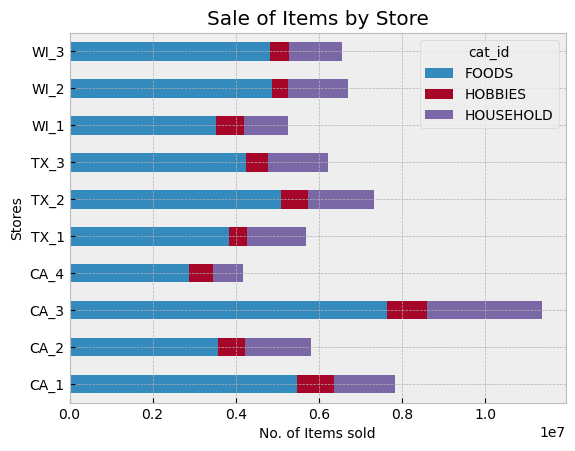

In [28]:
# Plot sales per store.
# 1. Sum sales by day columns grouped by stores and category.
# 2. Create a new column with totals of each category row.
# 3. Plot using horizontal bar as above.

sales_sum_per_day_store_cat = pd.DataFrame(sales.groupby(['store_id', 'cat_id'])[sales_cols_names].sum())
sales_sum_per_day_store_cat['total'] = sales_sum_per_day_store_cat[sales_cols_names].sum(axis=1)

sales_sum_per_day_store_cat['total'] \
        .unstack() \
        .plot \
        .barh(title='Sale of Items by Store',
               ylabel='Stores',
               xlabel='No. of Items sold',stacked=True)

#### Results
It is clear that the Carlifornia 3 (CA_3) sales the most items divided into Foods, HOuseholds and Hobbies in that order. My hypothesis would be to start a model on carlifornia CA_3 and FOODS, then add Household and then add Hobbies. After optimising for this group then add other carlifornia stores, then regions and then the whole dataset.

### What are sales per store over time

In [29]:
store_list = []

for i in sales['store_id'].unique():
    store_list.append(i)
    
print(store_list, len(store_list))

['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1', 'WI_2', 'WI_3'] 10


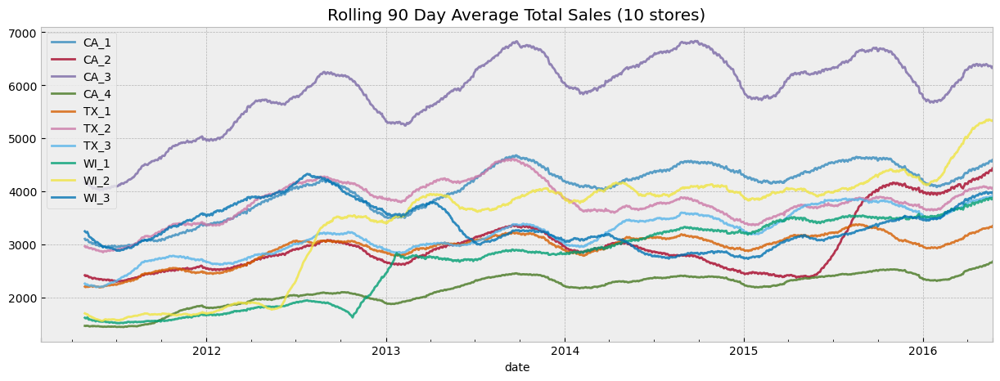

In [30]:
# Sales in stores over time
# 1. iterate through the store list looking throuhg the stores only if it matches container columns.
# 2. Slice the container with the matched stores
# 3. Sum along the column axis
# 4. Find the rolling average 90 days

for i in store_list:
    store_items = [c for c in container.columns if i in c]
    container[store_items] \
        .sum(axis=1) \
        .rolling(90).mean() \
        .plot(figsize=(15, 5),
              alpha=0.8,
              title='Rolling 90 Day Average Total Sales (10 stores)')
plt.legend(store_list)
plt.show()

In [31]:
sales_store_average = {}

for i in store_list:
    store_items = [c for c in container.columns if i in c]
    ser = container[store_items] \
        .sum(axis=1) \
        .rolling(90).mean() 
    for j in range(0, ser.size): 
        if j == ser.size-1: 
            sales_store_average.update({i:ser[j]})
            
print(sorted(sales_store_average, key=sales_store_average.get, reverse=True))


['CA_3', 'WI_2', 'CA_1', 'CA_2', 'TX_2', 'WI_3', 'TX_3', 'WI_1', 'TX_1', 'CA_4']


#### Results
There is an argument to use models by the rank of each store by sales. This is an on-going discussion and my shed more light in academic literature.

### In a calendar year where were the most sales?

Aim: The aim is to give us a visual representation of where most sales a made within the different categories in a calendar year and focus on an indentifieable trend.

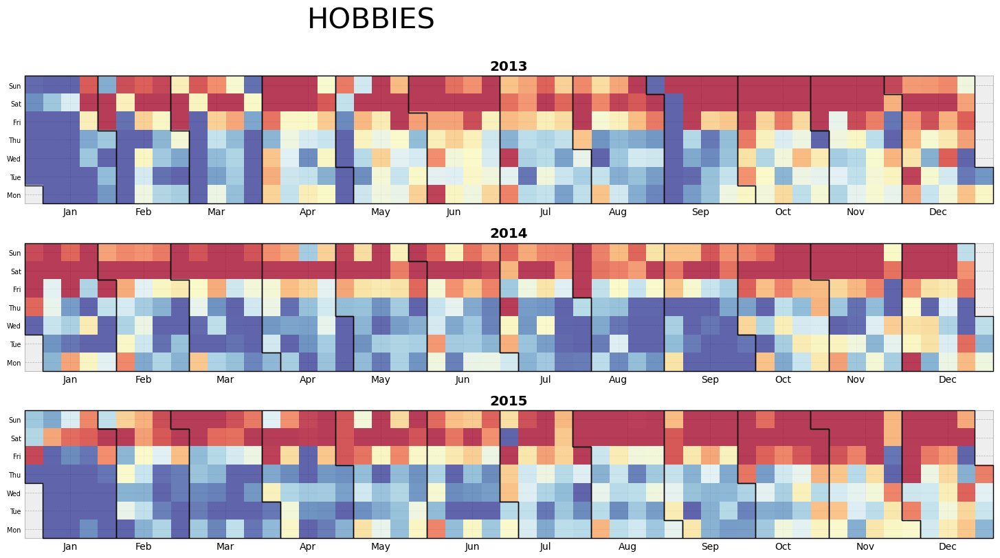

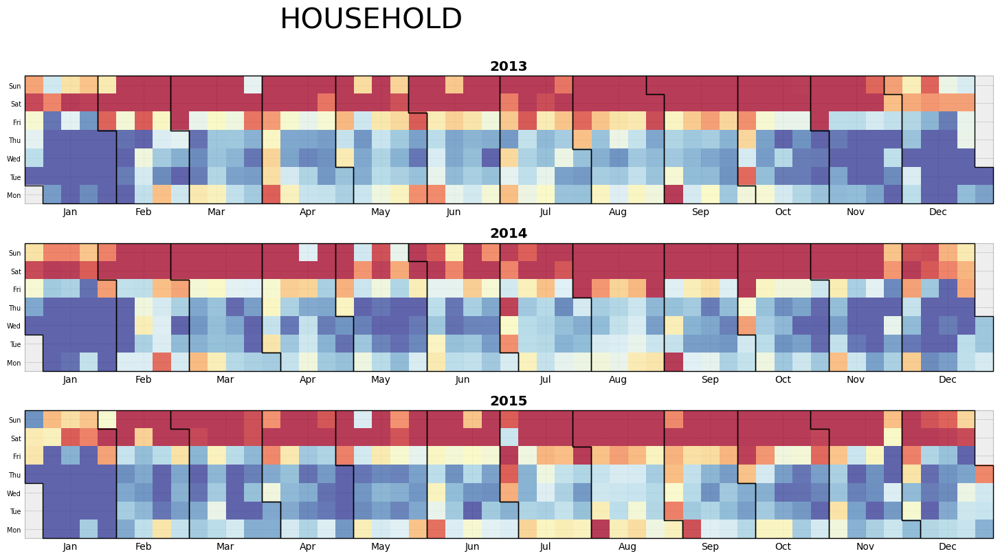

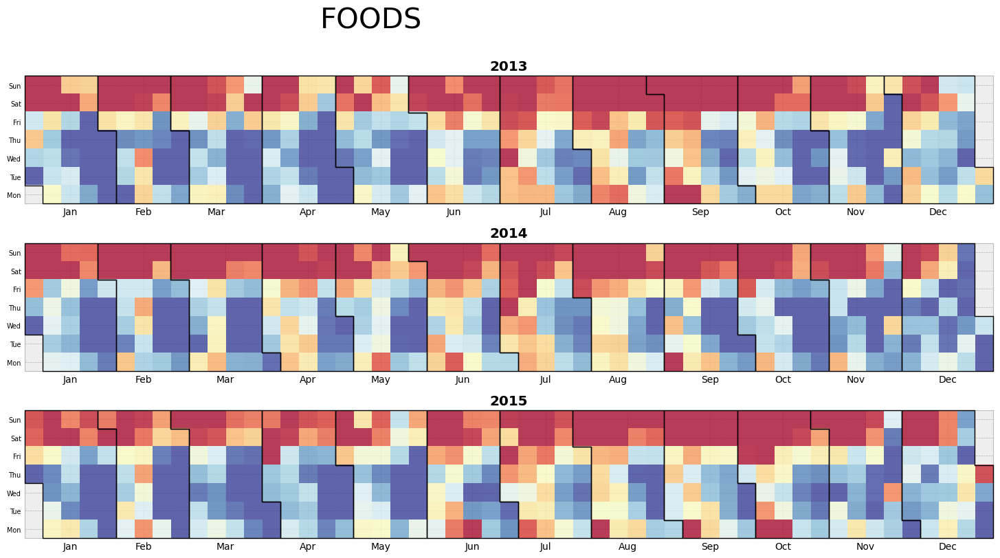

In [32]:

sscale = StandardScaler()

for i in sales['cat_id'].unique():
    fig, axes = plt.subplots(3, 1, figsize=(20, 8))
    items_col = [c for c in container.columns if i in c]
    sales2013 = container.loc[container.index.isin(pd.date_range('31-Dec-2012',
                                                                   periods=371))][items_col].mean(axis=1)
    vals = np.hstack(sscale.fit_transform(sales2013.values.reshape(-1, 1)))
    calmap(axes[0], 2013, vals.reshape(53,7).T)
    sales2014 = container.loc[container.index.isin(pd.date_range('30-Dec-2013',
                                                                   periods=371))][items_col].mean(axis=1)
    vals = np.hstack(sscale.fit_transform(sales2014.values.reshape(-1, 1)))
    calmap(axes[1], 2014, vals.reshape(53,7).T)
    sales2015 = container.loc[container.index.isin(pd.date_range('29-Dec-2014',
                                                                   periods=371))][items_col].mean(axis=1)
    vals = np.hstack(sscale.fit_transform(sales2015.values.reshape(-1, 1)))
    calmap(axes[2], 2015, vals.reshape(53,7).T)
    plt.suptitle(i, fontsize=30, x=0.4, y=1.01)
    plt.tight_layout()
    plt.show()

#### Results:
Most sales aremade during the weekends. In category is unique in how it behaves with hobies having a lot of sales in the winter months, while food tracks high in the summer months. Households staying relatively same throughout and only selling in the weekends.

### When was the higest and lowest sales date and what was there composition?

In [75]:
container_cat = sales.set_index('cat_id')[sales_cols_names] \
    .T \
    .merge(calendar.set_index('d')['date'],
           left_index=True,
           right_index=True,
            validate='1:1') \
    .set_index('date')


container_cat_grouped = container_cat.groupby(level=0, axis=1).sum()


print('The lowest sales date was', container.sum(axis=1).sort_values().index[0],
      ' it had', container.sum(axis=1).sort_values().values[0], 'sales consisting of',
      'Foods', container_cat_grouped['FOODS'].loc[container.sum(axis=1).sort_values().index[0]],
      ' Hobbies', container_cat_grouped['HOBBIES'].loc[container.sum(axis=1).sort_values().index[0]],
      ' & Household', container_cat_grouped['HOUSEHOLD'].loc[container.sum(axis=1).sort_values().index[0]]
     )

print('The highest sales date was', container.sum(axis=1).sort_values(ascending=False).index[0],
      ' it had', container.sum(axis=1).sort_values(ascending=False).values[0], 'sales consisting of',
      'Foods', container_cat_grouped['FOODS'].loc[container.sum(axis=1).sort_values(ascending=False).index[0]],
      ' Hobbies', container_cat_grouped['HOBBIES'].loc[container.sum(axis=1).sort_values(ascending=False).index[0]],
      ' & Household', container_cat_grouped['HOUSEHOLD'].loc[container.sum(axis=1).sort_values(ascending=False).index[0]]
     )


The lowest sales date was 2012-12-25 00:00:00  it had 11 sales consisting of Foods 11  Hobbies 0  & Household 0
The highest sales date was 2016-05-15 00:00:00  it had 59921 sales consisting of Foods 41447  Hobbies 5016  & Household 13458


<Axes: xlabel='date'>

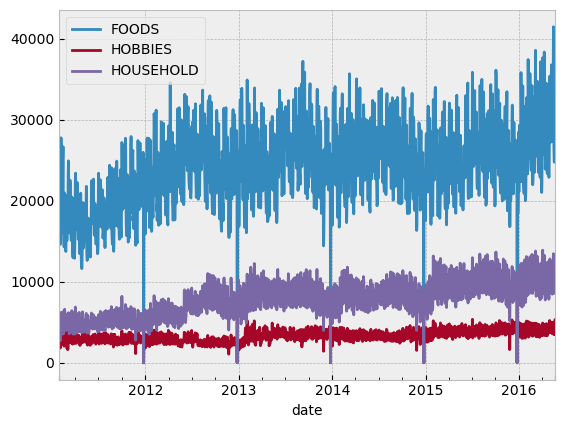

In [34]:
container_cat_grouped.plot()

#### Results

This starts to explaing  the results from the previougraph above. The drops in sales to almost zero are christmas day closures. The yearly peaks 

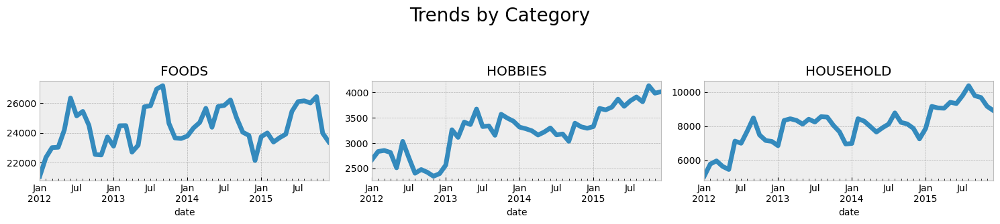

In [79]:

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
container_cat_grouped['2012-01-01':'2015-12-31'].groupby(pd.Grouper(freq='M', axis=0)).mean(numeric_only=True)['FOODS'].plot(kind='line',
              title='FOODS',
              lw=5,
              color=color_pal[0],
              ax=ax1)
container_cat_grouped['2012-01-01':'2015-12-31'].groupby(pd.Grouper(freq='M', axis=0)).mean(numeric_only=True)['HOBBIES'].plot(kind='line',
              title='HOBBIES',
              lw=5,
              color=color_pal[0],
              ax=ax2)
container_cat_grouped['2012-01-01':'2015-12-31'].groupby(pd.Grouper(freq='M', axis=0)).mean(numeric_only=True)['HOUSEHOLD'].plot(kind='line',
              title='HOUSEHOLD',
              lw=5,
              color=color_pal[0],
              ax=ax3)
fig.suptitle(f'Trends by Category',
                 size=20,
                 y=1.1)
plt.tight_layout()
plt.show()

In [45]:
first_date = calendar.set_index('date').sort_values(by='date').index[0]
print(first_date)
last_date = calendar.set_index('date').sort_values(by='date').index[-1]
print(last_date)

2011-01-29 00:00:00
2016-06-19 00:00:00


In [91]:
prices.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.580
1,CA_1,HOBBIES_1_001,11326,9.580
2,CA_1,HOBBIES_1_001,11327,8.260
3,CA_1,HOBBIES_1_001,11328,8.260
4,CA_1,HOBBIES_1_001,11329,8.260


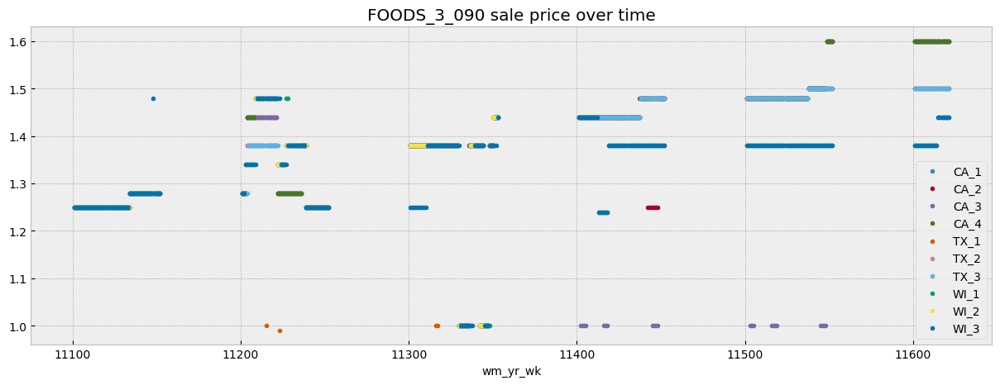

In [122]:
fig, ax = plt.subplots(figsize=(15, 5))
stores = []
for store, d in prices.query('item_id == "FOODS_3_090"').groupby('store_id'):
    d.plot(x='wm_yr_wk',
          y='sell_price',
          style='.',
          color=next(color_cycle),
          figsize=(15, 5),
          title='FOODS_3_090 sale price over time',
         ax=ax,
          legend=store)
    stores.append(store)
    plt.legend()
plt.legend(stores)
plt.show()

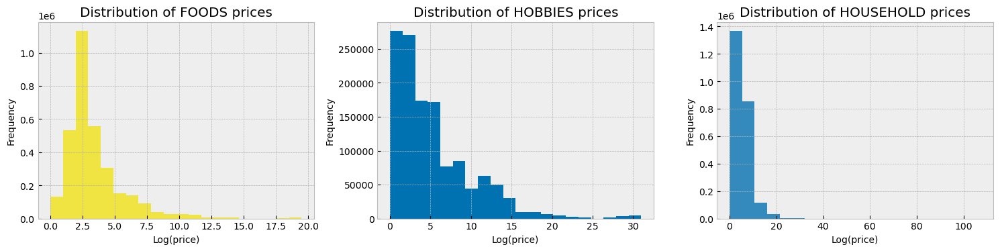

In [83]:
prices['Category'] = prices['item_id'].str.split('_', expand=True)[0]
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
i = 0
for cat, d in prices.groupby('Category'):
    ax = d['sell_price'] \
        .plot(kind='hist',
                         bins=20,
                         title=f'Distribution of {cat} prices',
                         ax=axs[i],
                                         color=next(color_cycle))
    ax.set_xlabel('Log(price)')
    i += 1
plt.tight_layout()

Data is right skewed and can work well with using log normal distribution to show better distribution.

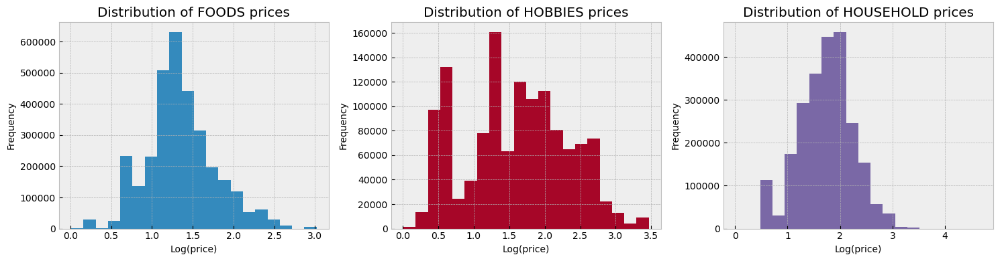

In [123]:
prices['Category'] = prices['item_id'].str.split('_', expand=True)[0]
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
i = 0
for cat, d in prices.groupby('Category'):
    ax = d['sell_price'].apply(np.log1p) \
        .plot(kind='hist',
                         bins=20,
                         title=f'Distribution of {cat} prices',
                         ax=axs[i],
                                         color=next(color_cycle))
    ax.set_xlabel('Log(price)')
    i += 1
plt.tight_layout()